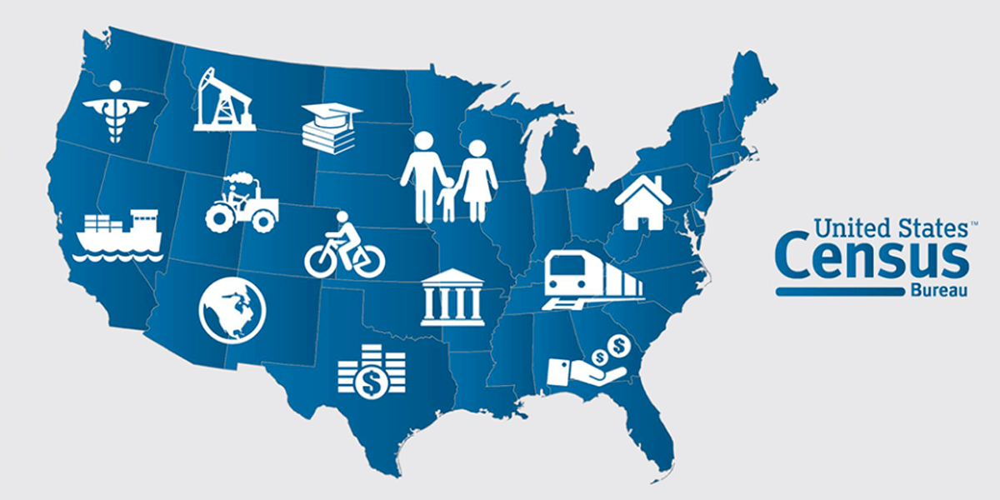

### Introduction:

This project involves the analysis of a U.S. census dataset obtained from the UCI (University of California at Irvine) Machine Learning Repository. It is structured into four distinct sections: Data Cleaning and Preprocessing, Exploratory Data Analysis, Predictive Analysis, and Theoretical Background. The ultimate objective is to develop a predictive model capable of determining whether the income of a randomly selected adult American citizen is above or below $50,000 per year. This prediction will be based on various features including age, education, occupation, gender, race, and more. By undertaking this project, we aim to gain valuable insights into the dataset and construct a robust model that can offer accurate income predictions for individuals.

## Data

Both training and test datasets are supplied along with the attribute names, have all been sourced from the UCI Machine Learning Repository (https://archive.ics.uci.edu/ml/datasets/adult). Both Datasets contain 15 variables (14 descriptive and 1 target), the dataset contains 32561 rows.

Variable descriptions are given in the table below:

Age: continuous.

Workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

Fnlwgt: continuous.

Education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

Education-num: continuous. 
    
Marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

Occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

Relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

Race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black. Sex: Female, Male.

Capital-gain: continuous.

Capital-loss: continuous.

Hours-per-week: continuous.

Native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.


## Problem Statement:

Our primary objective is to develop a predictive model that can accurately classify whether the income of a randomly selected adult American citizen is below or above $50,000 per year. This model will be trained using various demographic and socioeconomic features such as age, education, occupation, gender, and race. By achieving this goal, we aim to create a reliable tool that can provide insights into the income levels of individuals based on their given attributes.

In [1]:
#Importing the libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import plotly.graph_objs as go
from plotly.offline import iplot

In [2]:
! pip install dexplot

DEPRECATION: dexplot 0.1.4 has a non-standard dependency specifier scipy>=1.0matplotlib>=3.1. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of dexplot or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [3]:
df = pd.read_csv("adult.csv")
df.head()

,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [4]:
df.columns

Index(['39', ' State-gov', ' 77516', ' Bachelors', ' 13', ' Never-married',
       ' Adm-clerical', ' Not-in-family', ' White', ' Male', ' 2174', ' 0',
       ' 40', ' United-States', ' <=50K'],
      dtype='object')

# Exploratory Data Analysis (EDA)

In [5]:
df.drop([' 2174', ' 0', ' 40'], axis = 'columns', inplace = True)
df.head()

,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,<=50K
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,United-States,<=50K


In [6]:
# Since with the given name we are unable to judge what the data is indicating 
# We will rename the columns name to understand the dataset more easily

df.columns = ['Age', 'Type_of_Owner', 'id', 'Education', 'No_of_Projects_Done', 'Marital_Status', 'Job_Designation', 'Family_Relation', 'Race', 'Gender', 'Country', 'Salary']

In [7]:
df.head()

,Age,Type_of_Owner,id,Education,No_of_Projects_Done,Marital_Status,Job_Designation,Family_Relation,Race,Gender,Country,Salary
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,United-States,<=50K


In [8]:
df.shape

(32560, 12)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Age                  32560 non-null  int64 
 1   Type_of_Owner        32560 non-null  object
 2   id                   32560 non-null  int64 
 3   Education            32560 non-null  object
 4   No_of_Projects_Done  32560 non-null  int64 
 5   Marital_Status       32560 non-null  object
 6   Job_Designation      32560 non-null  object
 7   Family_Relation      32560 non-null  object
 8   Race                 32560 non-null  object
 9   Gender               32560 non-null  object
 10  Country              32560 non-null  object
 11  Salary               32560 non-null  object
dtypes: int64(3), object(9)
memory usage: 3.0+ MB


In [10]:
df.describe()

,Age,id,No_of_Projects_Done
count,32560.000000,3.256000e+04,32560.000000
mean,38.581634,1.897818e+05,10.080590
std,13.640642,1.055498e+05,2.572709
min,17.000000,1.228500e+04,1.000000
25%,28.000000,1.178315e+05,9.000000
50%,37.000000,1.783630e+05,10.000000
75%,48.000000,2.370545e+05,12.000000
max,90.000000,1.484705e+06,16.000000


In [11]:
df.isnull().sum()

Age                    0
Type_of_Owner          0
id                     0
Education              0
No_of_Projects_Done    0
Marital_Status         0
Job_Designation        0
Family_Relation        0
Race                   0
Gender                 0
Country                0
Salary                 0
dtype: int64

# Data Visualization

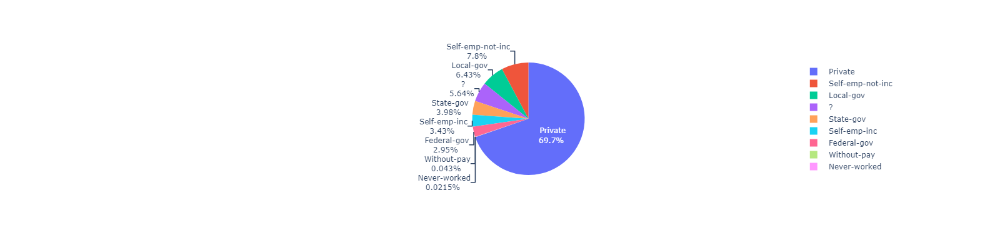

In [12]:
# Visualizing the Type of Sponsor Dataset

labels = df['Type_of_Owner'].value_counts().index
values = df['Type_of_Owner'].value_counts().values

colors = df['Type_of_Owner']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## From the above datasets we can see that most of the Jobs lies in the private sector and its around 70% infact

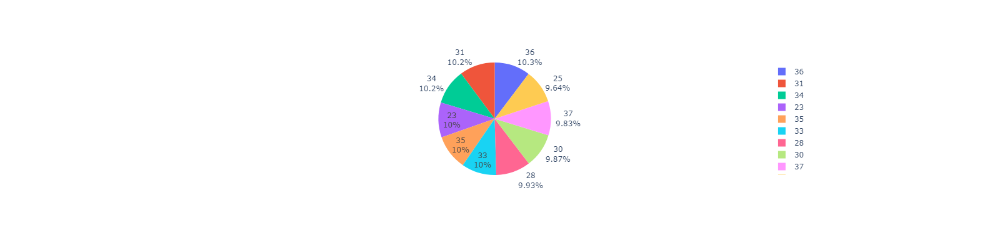

In [19]:
# Visualizing the Type of Age Dataset

labels = df['Age'].value_counts()[:10].index
values = df['Age'].value_counts()[:10].values

colors = df['Age']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## From the above dataset we can see that most of the job-seeker falls in the age-group of 30-40 

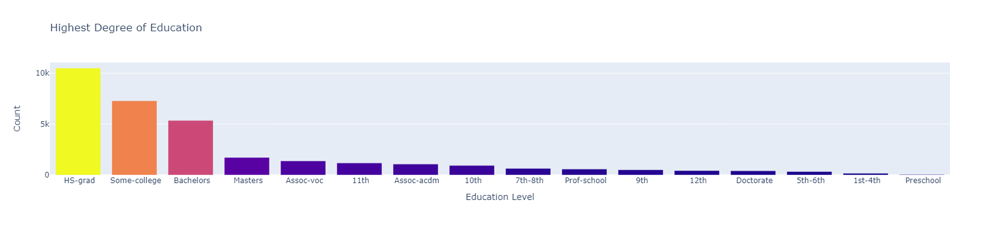

In [16]:
# Visualizing the Highest Degree of Eduaction

labels = df['Education'].value_counts().index
values = df['Education'].value_counts().values

fig = go.Figure(data=[go.Bar(x=labels, y=values, marker=dict(color=values))])

fig.update_layout(title='Highest Degree of Education', xaxis_title='Education Level', yaxis_title='Count')

fig.show()

## Most of the Working Class people have HS-grad degree followed by Some-College degree and Bachelors

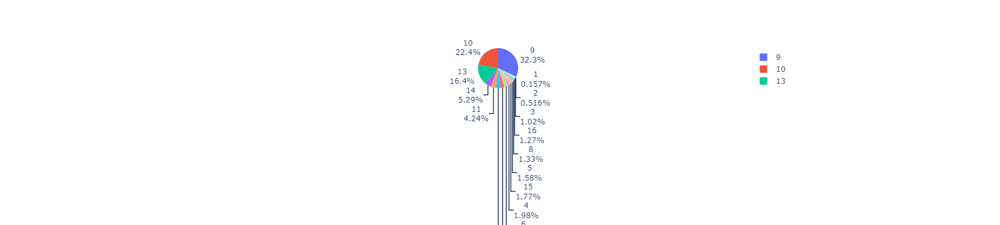

In [20]:
# Visualizing the No_of_Projects_Done

labels = df['No_of_Projects_Done'].value_counts().index
values = df['No_of_Projects_Done'].value_counts().values

colors = df['No_of_Projects_Done']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## Most of the People have 9 or 10 projects in their account

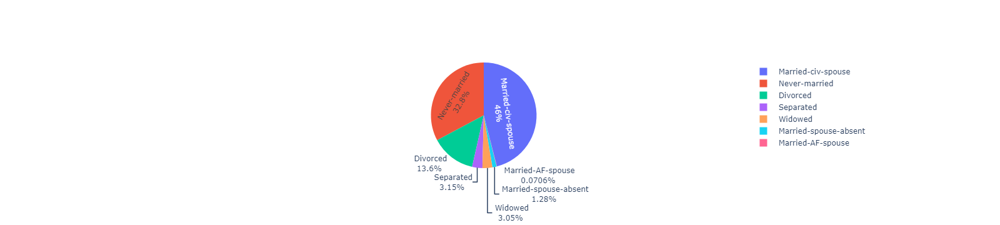

In [21]:
# Visualizing the Marital Status of the Working Class People

labels = df['Marital_Status'].value_counts().index
values = df['Marital_Status'].value_counts().values

colors = df['Marital_Status']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## From the output we can see that 46% people are married and 32.8% people never get married

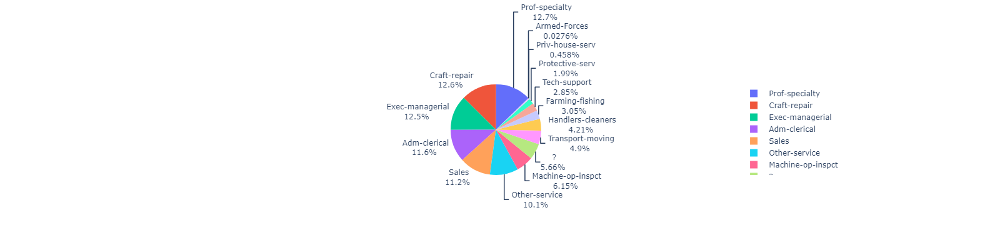

In [22]:
# Visualizing the Job Descriptions of the Working Class People

labels = df['Job_Designation'].value_counts().index
values = df['Job_Designation'].value_counts().values

colors = df['Job_Designation']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## About 50% of the people are involved in Prof-speciality, Craft-repair, Exec-managerial and Adm-clerical

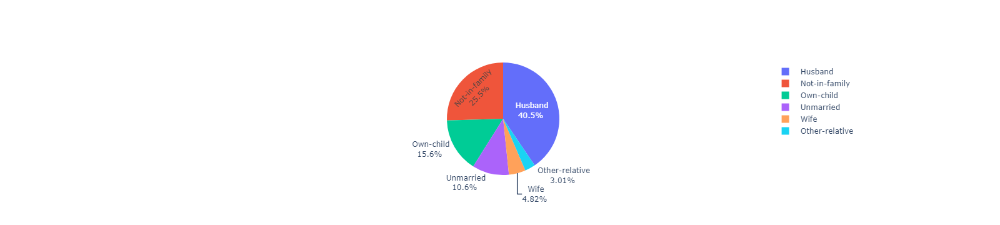

In [23]:
# Visualizing the Family-Relation of the Working Class People

labels = df['Family_Relation'].value_counts().index
values = df['Family_Relation'].value_counts().values

colors = df['Family_Relation']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## Most of the working class person are husband

In [24]:
# Try to see the different type of race of the Working Class

df['Race'].unique()

array([' White', ' Black', ' Asian-Pac-Islander', ' Amer-Indian-Eskimo',
       ' Other'], dtype=object)

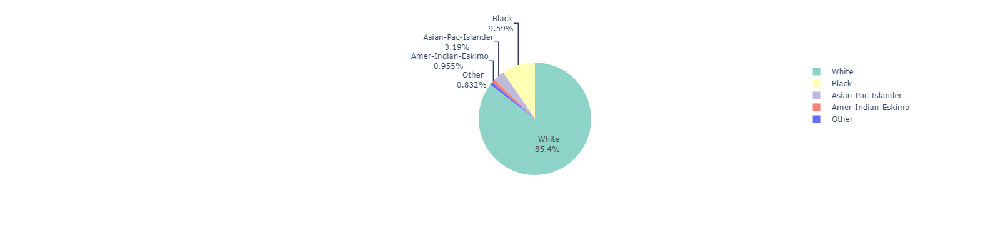

In [26]:
# Visualizing the Race of the Working Class People

labels = df['Race'].value_counts().index
values = df['Race'].value_counts().values

colors = ['#8dd3c7', '#ffffb3', '#bebada', '#fb8072']

fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo="label+percent", marker=dict(colors=colors))])

fig.show()

## From the above plot it is quite visble that White people have supermacy over the Black while getting job and Black people still face the Color Discriminations

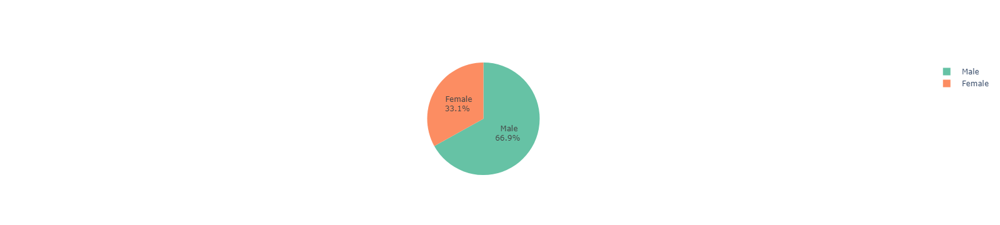

In [28]:
# Visualizing the Gender of the Working Class People

labels = df['Gender'].value_counts().index
values = df['Gender'].value_counts().values

colors = ['#66c2a5', '#fc8d62']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## From the above it is visible that in the job sector still female are lagging to get the job

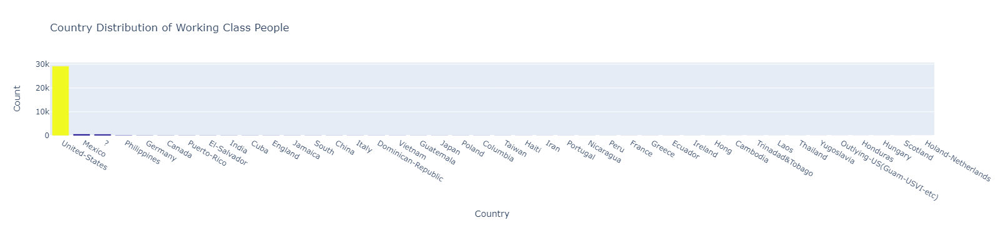

In [32]:
# Visualizing the Country of the Working Class People

labels = df['Country'].value_counts().index
values = df['Country'].value_counts().values

fig = go.Figure(go.Bar(x=labels, y=values, marker=dict(color=values)))

fig.update_layout(title='Country Distribution of Working Class People', xaxis_title='Country', yaxis_title='Count')

fig.show()

## About 90% of the Working Class people are residents of the US

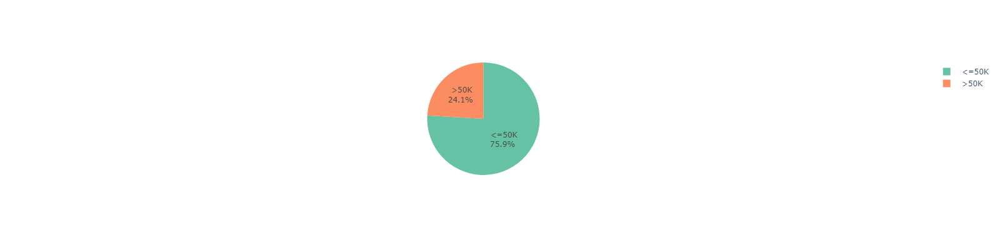

In [34]:
# Visualizing the Salary of the Working Class People

labels = df['Salary'].value_counts().index
values = df['Salary'].value_counts().values

colors = ['#66c2a5', '#fc8d62']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, textinfo="label+percent", marker = dict(colors=colors))])

fig.show()

## Only round 24% of the people get the salary above 24% and around 76% of the people get 50k or less than 50k as salary

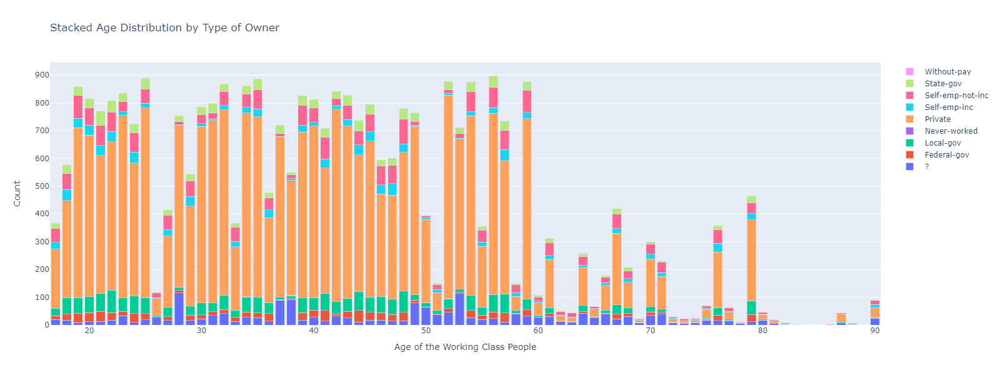

In [38]:
import plotly.graph_objects as go

stacked_data = df.groupby(['Age', 'Type_of_Owner']).size().unstack()

age_categories = df['Age'].unique()

traces = []
for owner_type in stacked_data.columns:
    trace = go.Bar(x=age_categories, y=stacked_data[owner_type], name=owner_type)
    traces.append(trace)

layout = go.Layout(title='Stacked Age Distribution by Type of Owner',
                   xaxis=dict(title='Age of the Working Class People'),
                   yaxis=dict(title='Count'),
                   barmode='stack',
                   width=1200, height=600)

fig = go.Figure(data=traces, layout=layout)

fig.show()

## Based on the graph presented, it is evident that the distribution of job types among individuals of different age groups varies significantly. While the majority of people across all age groups are engaged in private sector jobs, it is noteworthy that individuals between the ages of 17 and 60 predominantly occupy private job positions.

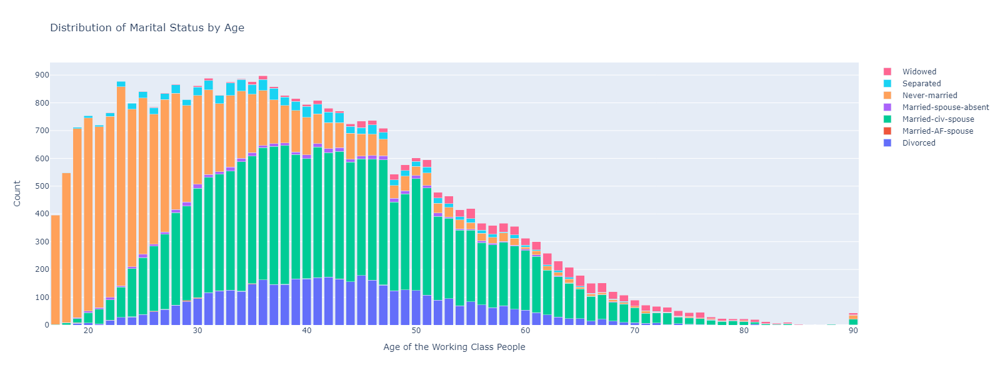

In [40]:
# Grouping the data by 'Age' and 'Marital_Status' and counting occurrences
grouped_data = df.groupby(['Age', 'Marital_Status']).size().unstack()

# Creating traces for each marital status
traces = []
for marital_status in grouped_data.columns:
    trace = go.Bar(
        x=grouped_data.index,
        y=grouped_data[marital_status],
        name=marital_status
    )
    traces.append(trace)

layout = go.Layout(
    title="Distribution of Marital Status by Age",
    xaxis=dict(title="Age of the Working Class People"),
    yaxis=dict(title="Count"),
    barmode='stack',
    width=1200,
    height=600
)

fig = go.Figure(data=traces, layout=layout)

fig.show()

## Based on the provided data, it is evident that individuals within the age group of 17-30 are predominantly unmarried. Conversely, individuals within the age group of 30-65 are predominantly married, while a significant portion of individuals within the age group of 30-55 are divorced.

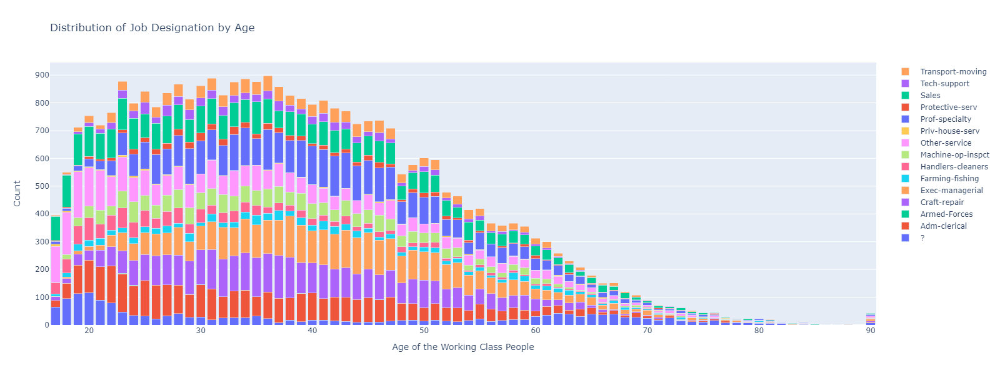

In [43]:
# Grouping the data by 'Age' and 'Job_Designation' and counting occurrences
grouped_data = df.groupby(['Age', 'Job_Designation']).size().unstack()

# Creating traces for each job designation
traces = []
for job_designation in grouped_data.columns:
    trace = go.Bar(
        x=grouped_data.index,
        y=grouped_data[job_designation],
        name=job_designation
    )
    traces.append(trace)

layout = go.Layout(
    title="Distribution of Job Designation by Age",
    xaxis=dict(title="Age of the Working Class People"),
    yaxis=dict(title="Count"),
    barmode='stack',
    width=1200,
    height=600
)

fig = go.Figure(data=traces, layout=layout)

fig.show()

## From the above graph we can see that how the Age and Job-Profile of people varies

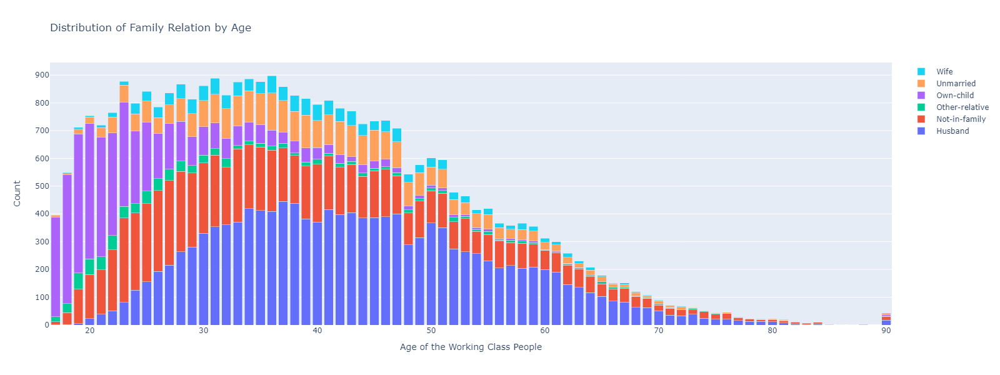

In [44]:
# Grouping the data by 'Age' and 'Family_Relation' and counting occurrences
grouped_data = df.groupby(['Age', 'Family_Relation']).size().unstack()

# Creating traces for each family relation
traces = []
for family_relation in grouped_data.columns:
    trace = go.Bar(
        x=grouped_data.index,
        y=grouped_data[family_relation],
        name=family_relation
    )
    traces.append(trace)

layout = go.Layout(
    title="Distribution of Family Relation by Age",
    xaxis=dict(title="Age of the Working Class People"),
    yaxis=dict(title="Count"),
    barmode='stack',
    width=1200,
    height=600
)

fig = go.Figure(data=traces, layout=layout)

fig.show()

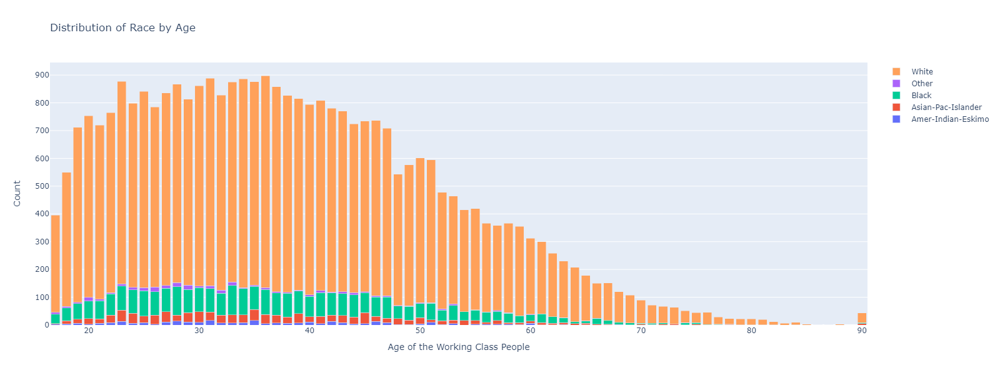

In [45]:
# Grouping the data by 'Age' and 'Race' and counting occurrences
grouped_data = df.groupby(['Age', 'Race']).size().unstack()

# Creating traces for each race
traces = []
for race in grouped_data.columns:
    trace = go.Bar(
        x=grouped_data.index,
        y=grouped_data[race],
        name=race
    )
    traces.append(trace)

layout = go.Layout(
    title="Distribution of Race by Age",
    xaxis=dict(title="Age of the Working Class People"),
    yaxis=dict(title="Count"),
    barmode='stack',
    width=1200,
    height=600
)

fig = go.Figure(data=traces, layout=layout)

fig.show()

## From the above graph its clear most people in any age group are predominantly white

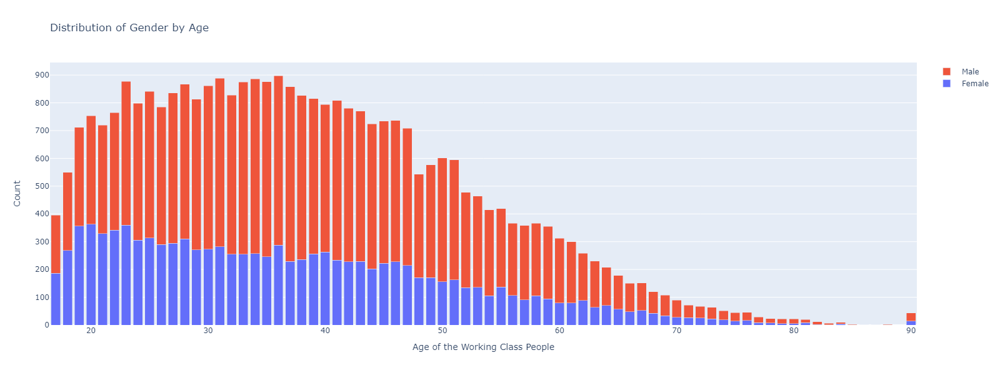

In [47]:
# Grouping the data by 'Age' and 'Gender' and counting occurrences
grouped_data = df.groupby(['Age', 'Gender']).size().unstack()

# Creating traces for each gender
traces = []
for gender in grouped_data.columns:
    trace = go.Bar(
        x=grouped_data.index,
        y=grouped_data[gender],
        name=gender
    )
    traces.append(trace)

layout = go.Layout(
    title="Distribution of Gender by Age",
    xaxis=dict(title="Age of the Working Class People"),
    yaxis=dict(title="Count"),
    barmode='stack',
    width=1200,
    height=600
)

fig = go.Figure(data=traces, layout=layout)

fig.show()

## From the above graph that most working female fall in the age-group of 17-55 and infact they have started working at early age while most male in the age-group of 23 onwards

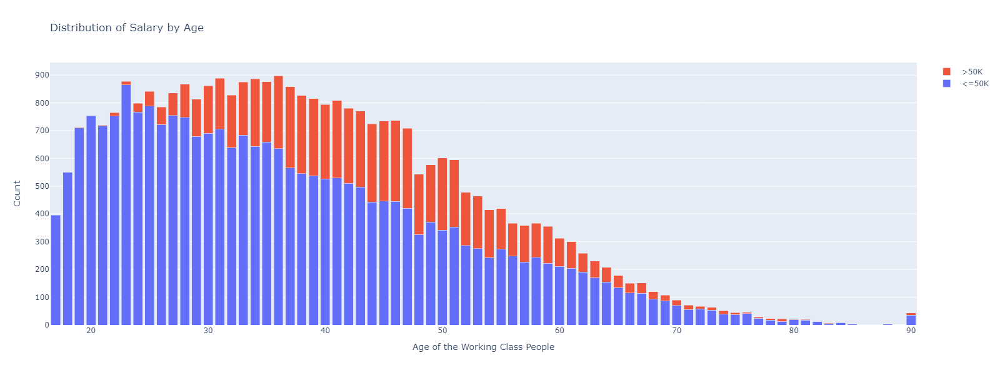

In [49]:
# Grouping the data by 'Age' and 'Salary' and counting occurrences
grouped_data = df.groupby(['Age', 'Salary']).size().unstack()

# Creating traces for each salary category
traces = []
for salary_category in grouped_data.columns:
    trace = go.Bar(
        x=grouped_data.index,
        y=grouped_data[salary_category],
        name=salary_category
    )
    traces.append(trace)

layout = go.Layout(
    title="Distribution of Salary by Age",
    xaxis=dict(title="Age of the Working Class People"),
    yaxis=dict(title="Count"),
    barmode='stack',
    width=1200,
    height=600
)

fig = go.Figure(data=traces, layout=layout)

fig.show()

## From the graph that with the passes of age tendency to get more salaries increases in general

# Splitting the Data into Train and Test Set

In [102]:
X = df.drop(['Age', 'id', 'Salary', 'Country', 'Family_Relation'], axis = 1)
y = df['Salary']

In [103]:
# split X and y into training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print("The size of training input is", X_train.shape)
print("The size of training output is", y_train.shape)
print("The size of testing input is", X_test.shape)
print("The size of testing output is", y_test.shape)

The size of training input is (26048, 7)
The size of training output is (26048,)
The size of testing input is (6512, 7)
The size of testing output is (6512,)


# Feature Engineering

In [104]:
# Importing the category Encoders
!pip install category_encoders
import category_encoders as ce

DEPRECATION: dexplot 0.1.4 has a non-standard dependency specifier scipy>=1.0matplotlib>=3.1. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of dexplot or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [105]:
X_train.head()

,Type_of_Owner,Education,No_of_Projects_Done,Marital_Status,Job_Designation,Race,Gender
24639,Private,12th,8,Never-married,Machine-op-inspct,White,Male
5514,State-gov,Some-college,10,Never-married,Adm-clerical,White,Female
19777,Private,Some-college,10,Widowed,Exec-managerial,White,Female
10781,Private,HS-grad,9,Never-married,Tech-support,Black,Male
32239,Private,Assoc-voc,11,Married-civ-spouse,Farming-fishing,White,Male


In [106]:
X_test.head()

,Type_of_Owner,Education,No_of_Projects_Done,Marital_Status,Job_Designation,Race,Gender
14160,Private,HS-grad,9,Divorced,Adm-clerical,White,Female
27047,State-gov,HS-grad,9,Married-civ-spouse,Exec-managerial,White,Female
28867,Private,Bachelors,13,Married-civ-spouse,Exec-managerial,Black,Male
5667,Private,Doctorate,16,Never-married,Prof-specialty,White,Male
7827,Private,Masters,14,Widowed,Prof-specialty,White,Female


In [55]:
encoder = ce.OrdinalEncoder(cols=['Education', 'Type_of_Owner', 'Gender', 'Job_Designation', 'Marital_Status', 'No_of_Projects_Done', 'Race'])

X_train = encoder.fit_transform(X_train)
X_test = encoder.transform(X_test)

In [56]:
X_train.head()

,Type_of_Owner,Education,No_of_Projects_Done,Marital_Status,Job_Designation,Race,Gender
24639,1,1,1,1,1,1,1
5514,2,2,2,1,2,1,2
19777,1,2,2,2,3,1,2
10781,1,3,3,1,4,2,1
32239,1,4,4,3,5,1,1


In [57]:
y_train.head()

24639     <=50K
5514      <=50K
19777     <=50K
10781     <=50K
32239     <=50K
Name: Salary, dtype: object

In [58]:
y_test.head()

14160     <=50K
27047     <=50K
28867      >50K
5667       >50K
7827      <=50K
Name: Salary, dtype: object

# Model Building

## Decision Tree Classifier

In [76]:
# Importing DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

clf = DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=0)

# Fitting/Training the Model
clf.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=0)

In [77]:
# Predicting Test set results using the Criterion Gini Index
y_pred = clf.predict(X_test)

In [78]:
# Finding the training and testing accuracy
print("Training Accuracy: ",clf.score(X_train, y_train))
print("Testing Accuracy: ", clf.score(X_test, y_test))

Training Accuracy:  0.7867782555282555
Testing Accuracy:  0.7831695331695332


## From the above output we can see that there is no variation in the train set and test accuracy

In [87]:
from sklearn.metrics import confusion_matrix

# Printing the confusion Matrix
cm_dc = confusion_matrix(y_test, y_pred)
print(cm_dc)

[[4296  616]
 [ 669  931]]


In [88]:
# Printing the scores on training and test set

print('Training set Score: {:.4f}'.format(clf.score(X_train, y_train)))
print('Test set Score: {:.4f}'.format(clf.score(X_test, y_test)))

Training set Score: 0.7868
Test set Score: 0.7832


## Logistic regression

In [90]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [91]:
# Importing the required Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

# Defining model
model = LogisticRegression()
model.fit(X_train, y_train)

# Predicting the values for x-test
y_pred = model.predict(X_test)

In [92]:
# Finding the training and testing accuracy
print("Training Accuracy: ",model.score(X_train, y_train))
print("Testing Accuracy: ", model.score(X_test, y_test))

Training Accuracy:  0.7495777027027027
Testing Accuracy:  0.7446253071253072


## Random Forest

In [93]:
# Importing the Libraris
from sklearn.ensemble import RandomForestClassifier

# Creating a model
model = RandomForestClassifier()
model.fit(X_train, y_train)

# Predicting the value for X_test
y_pred = model.predict(X_test)

In [94]:
# Finding the training and testing accuracy
print("Training Accuracy: ",model.score(X_train, y_train))
print("Testing Accuracy: ", model.score(X_test, y_test))

Training Accuracy:  0.855382371007371
Testing Accuracy:  0.8220208845208845


In [95]:
# Printing the confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred)
print(cm_rf)

[[4461  451]
 [ 708  892]]


## KNeighborsClassifier

In [96]:
from sklearn.neighbors import KNeighborsClassifier

# Creating a model
model = KNeighborsClassifier(n_neighbors = 5)

# Feeding the training data into the model
model.fit(X_train, y_train)

# Predicting the values for x-test
y_pred = model.predict(X_test)

In [97]:
# finding the training and testing accuracy
print("Training Accuracy: ",model.score(X_train, y_train))
print("Testing Accuracy: ", model.score(X_test, y_test))

Training Accuracy:  0.8205236486486487
Testing Accuracy:  0.8031326781326781


In [98]:
# printing the confusion Matrix
cm_knn = confusion_matrix(y_test, y_pred)
print(cm_knn)

[[4297  615]
 [ 667  933]]


In [99]:
# Calculating the classification report
classification_rep = classification_report(y_test, y_pred)

# Printing the classification report
print("Classification Report:")
print(classification_rep)

Classification Report:
              precision    recall  f1-score   support

       <=50K       0.87      0.87      0.87      4912
        >50K       0.60      0.58      0.59      1600

    accuracy                           0.80      6512
   macro avg       0.73      0.73      0.73      6512
weighted avg       0.80      0.80      0.80      6512

